# CA-03 Decision Tree Algortihm

---
### Name: Alena Sanchez
### Course: Intro to Machine Learning (BSAN 6070)
### Professor: Arin Brahma


---



# Import Neccessary Packages and Data

In [212]:
from IPython.core.display import Image
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn import tree
from sklearn.datasets import load_iris
import graphviz
from sklearn.tree import DecisionTreeClassifier
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
from io import StringIO
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score 
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
import time

In [213]:
url = "https://github.com/ArinB/MSBA-CA-Data/blob/main/CA03/census_data.csv?raw=true"
data = pd.read_csv(url, encoding = "ISO-8859-1") 

# Part 1:

## 1. Data Quality Analysis (DQA)

In [214]:
#11 variables and 48842 records
data.shape

(48842, 11)

In [215]:
data.head(10)

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0
5,b. 31-40,e. High,c. High,a. = 0,b. Mid,d. 14,d. Masters,b. income,d. 36-40 & 56-60,train,0
6,a. 0-30,a. Low,b. Mid,a. = 0,a. Low,a. 0-8,a. Low,b. income,e. 40-55,train,0
7,d. 41-50 & 61-70,e. High,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,e. 40-55,train,1
8,d. 41-50 & 61-70,e. High,b. Mid,c. > 0,b. Mid,d. 14,d. Masters,b. income,c. 31-35 & 61-70,train,1
9,b. 31-40,e. High,c. High,c. > 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,1


In [216]:
data.tail(10)

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
48832,d. 41-50 & 61-70,c. Mid - Mid,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,c. 31-35 & 61-70,test,0
48833,b. 31-40,c. Mid - Mid,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,c. 31-35 & 61-70,test,0
48834,b. 31-40,a. Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,b. income,a. 0-25,test,0
48835,b. 31-40,a. Low,b. Mid,a. = 0,c. High,d. 14,d. Masters,b. income,e. 40-55,test,0
48836,b. 31-40,e. High,a. Low,a. = 0,c. High,c. 13,c. Bachelors,b. income,c. 31-35 & 61-70,test,0
48837,b. 31-40,e. High,b. Mid,a. = 0,b. Mid,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48838,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,c. 31-35 & 61-70,test,0
48839,d. 41-50 & 61-70,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48840,b. 31-40,b. Mid - Low,a. Low,c. > 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,test,0
48841,e. 51-60,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,c. 31-35 & 61-70,test,1


In [217]:
data.columns

Index(['hours_per_week_bin', 'occupation_bin', 'msr_bin', 'capital_gl_bin',
       'race_sex_bin', 'education_num_bin', 'education_bin', 'workclass_bin',
       'age_bin', 'flag', 'y'],
      dtype='object')

In [218]:
#only displays descriptive statistics for y column as all other columns do not contain numerical data 
data.describe()

,y
count,48842.000000
mean,0.239282
std,0.426649
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


In [219]:
#describing categorical columns

data.describe(include='object')

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag
count,48842,48842,48842,48842,48842,48842,48842,48842,48842,48842
unique,5,5,3,3,3,5,5,2,5,2
top,b. 31-40,c. Mid - Mid,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,e. 40-55,train
freq,26639,13971,22047,42525,29737,30324,30324,46012,13963,32561


In [220]:
#number of null values for each Column
data.isnull().sum()

#there are no nulls in the dataset!

hours_per_week_bin    0
occupation_bin        0
msr_bin               0
capital_gl_bin        0
race_sex_bin          0
education_num_bin     0
education_bin         0
workclass_bin         0
age_bin               0
flag                  0
y                     0
dtype: int64

## 2. Exploratory Data Analysis


---

After running the .csv file in Excel and running Pivot Tables and going through the data we can see that the table is not normalized. This dataframe has the bins as the columns with the category record is associated with as the field value. Using the Pivot Table function in Excel we can see the number of people within each category using COUNT. (This counts the number of records associated with the UNIQUE values in that category.)

---

Similarly, down below is a series of graphs (100% stacked) for each categorical variable. The graph depicts the count of people in each category split by "Y", which is whether or not a person makes more or less than 50K. (1: >50K, 0: <=50K)

---





###*Age*

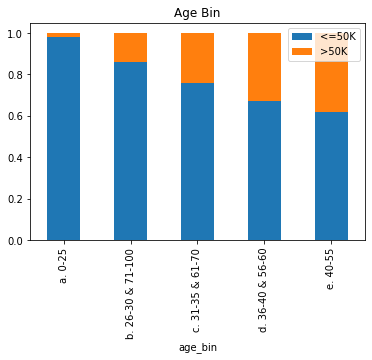

In [221]:
age = pd.crosstab(data['age_bin'],data['y'],normalize='index')
age.plot(kind='bar',stacked=True)
plt.yticks([0,.20,.40,.60,.80,1.0])
plt.legend(['<=50K', '>50K'])
plt.title('Age Bin')
plt.show()

###*Capital Gain/Loss*

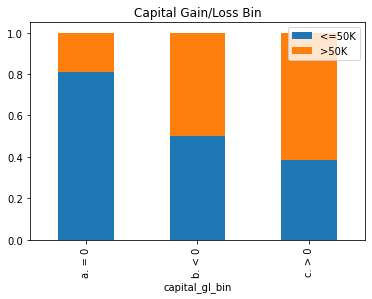

In [222]:
capital = pd.crosstab(data['capital_gl_bin'],data['y'],normalize='index')
capital.plot(kind='bar',stacked=True)
plt.yticks([0,.20,.40,.60,.80,1.0])
plt.legend(['<=50K', '>50K'])
plt.title('Capital Gain/Loss Bin')
plt.show()

###*Education*

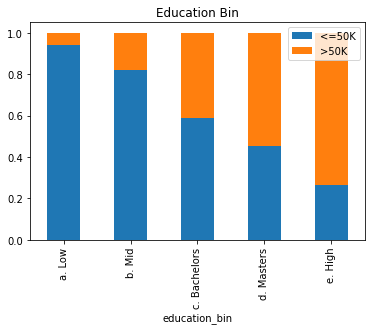

In [223]:
education = pd.crosstab(data['education_bin'],data['y'],normalize='index')
education.plot(kind='bar',stacked=True)
plt.yticks([0,.20,.40,.60,.80,1.0])
plt.legend(['<=50K', '>50K'])
plt.title('Education Bin')
plt.show()

###*Hours per Week*

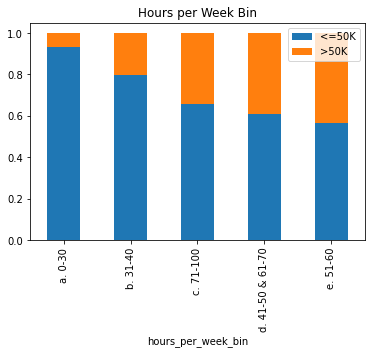

In [224]:
hours = pd.crosstab(data['hours_per_week_bin'],data['y'],normalize='index')
hours.plot(kind='bar',stacked=True)
plt.yticks([0,.20,.40,.60,.80,1.0])
plt.legend(['<=50K', '>50K'])
plt.title('Hours per Week Bin')
plt.show()

###*Marriage Status and Relationship*

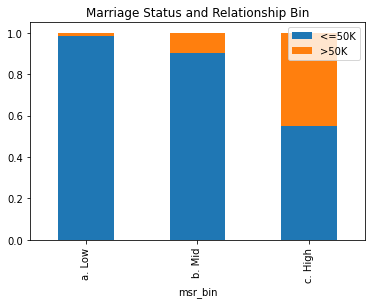

In [225]:
msr = pd.crosstab(data['msr_bin'],data['y'],normalize='index')
msr.plot(kind='bar',stacked=True)
plt.yticks([0,.20,.40,.60,.80,1.0])
plt.legend(['<=50K', '>50K'])
plt.title('Marriage Status and Relationship Bin')
plt.show()

###*Occupation*

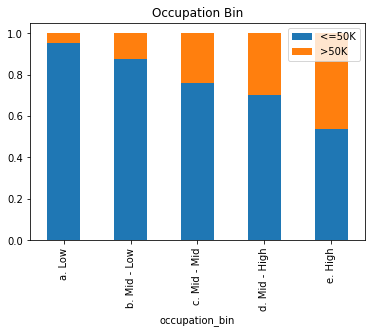

In [226]:
occupation = pd.crosstab(data['occupation_bin'],data['y'],normalize='index')
occupation.plot(kind='bar',stacked=True)
plt.yticks([0,.20,.40,.60,.80,1.0])
plt.legend(['<=50K', '>50K'])
plt.title('Occupation Bin')
plt.show()

###*Race and Sex*


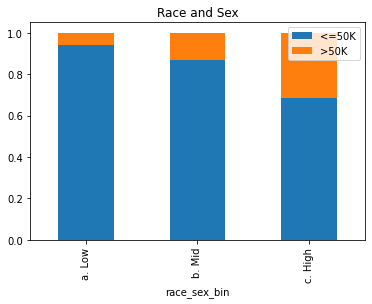

In [227]:
race_sex = pd.crosstab(data['race_sex_bin'],data['y'],normalize='index')
race_sex.plot(kind='bar',stacked=True)
plt.yticks([0,.20,.40,.60,.80,1.0])
plt.legend(['<=50K', '>50K'])
plt.title('Race and Sex')
plt.show()

###*SPLITTING AND ENCODING for MODEL*

Now, we will split the data into two datasets. TRAIN and TEST, so that we can run the Decision Tree Model later on in this program!

In [228]:
#splitting data into test and training datasets and preparing it to be put into model.

TRAIN = data[data['flag']=='train']
TEST = data[data['flag']=='test']

In [229]:
TRAIN.head()
TRAIN.shape
#32561 training records

(32561, 11)

In [230]:
TEST.head()
TEST.shape
#16281 test records

(16281, 11)

In [231]:
#df_onehot = pd.get_dummies(df_main, 'c')
#df_onehot['y'] = df_main['y'].copy()

x_train = pd.get_dummies(TRAIN[['age_bin', 'capital_gl_bin', 'education_bin','hours_per_week_bin', 'msr_bin', 'occupation_bin', 'race_sex_bin']],drop_first=True)
y_train= TRAIN['y'].copy()

#https://www.kaggle.com/gabrielaltay/categorical-variables-in-decision-trees

In [232]:
x_test = pd.get_dummies(TEST[['age_bin', 'capital_gl_bin', 'education_bin','hours_per_week_bin', 'msr_bin', 'occupation_bin', 'race_sex_bin']],drop_first=True)
y_test = TEST['y'].copy()

# Part 2:

##3. Build Decision Tree Classifier Models

In [233]:
dtree = DecisionTreeClassifier(max_depth=10, random_state=101,
                               max_features = None, min_samples_leaf=15)
dtree.fit(x_train, y_train)
y_pred=dtree.predict(x_test)

#code from assignemnt

In [234]:
dtree
y_pred

array([0, 0, 0, ..., 1, 0, 1])

##4. Visualize Your Decision Tree using GraphViz

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.886673 to fit



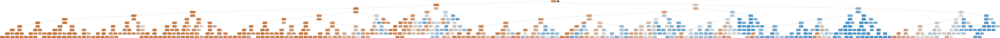

In [235]:
dot_data = StringIO()

export_graphviz(dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

#source: https://medium.com/@rnbrown/creating-and-visualizing-decision-trees-with-python-f8e8fa394176

##5. Evaluate Decision Tree Performance

In [236]:
#confusion matrix

matrix = confusion_matrix(y_test, y_pred).ravel()

print("TRUE NEGATIVE:")
print(matrix[0])
print("======")
print("FALSE POSITIVE:")
print(matrix[1])
print("======")
print("FALSE NEGATIVE:")
print(matrix[2])
print("======")
print("TRUE POSITIVE:")
print(matrix[3])

TRUE NEGATIVE:
11521
FALSE POSITIVE:
914
FALSE NEGATIVE:
1653
TRUE POSITIVE:
2193


In [237]:
#accuracy

accuracy_score(y_test, y_pred, normalize=False)
#13714 correct samples

accuracy_score(y_test, y_pred)
#84.23% accuracy

0.8423315521159634

In [238]:
#precision 
precision_score(y_test, y_pred)

0.7058255551979401

In [239]:
#recall
recall_score(y_test, y_pred)

0.5702028081123245

In [240]:
#f1score
f1_score(y_test, y_pred)

0.6308068459657701

In [241]:
#accuracy, precision, recall, f1-score

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.77     16281
weighted avg       0.83      0.84      0.84     16281



In [242]:
#AUC Value

auc = roc_auc_score(y_test,y_pred)
print(auc)

#0.7483502983062628 is the area under the curve

0.7483502983062628


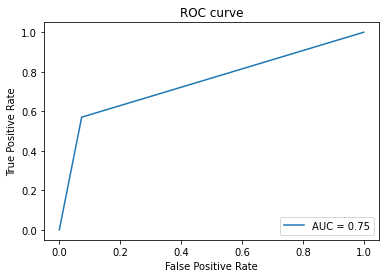

In [243]:
#ROC Curve

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()
plt.title('ROC curve')
plt.show()

# Part 3:

##6. Tune Decision Tree Performance

In [244]:
#Manually varying hyperparameters and comparing Models through Accuracy, Precision, F1 Scores, and Recall

###*MODEL 1*

In [245]:
dtree1 = DecisionTreeClassifier(criterion = 'entropy', min_samples_split=2,
                                min_samples_leaf= 10, max_depth=30,
                                random_state=101, max_features = None)
dtree1.fit(x_train, y_train)
y_pred=dtree1.predict(x_test)
accuracy_score(y_test, y_pred)

0.8395061728395061

In [246]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.56      0.62      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.74      0.76     16281
weighted avg       0.83      0.84      0.83     16281



###*MODEL 2*

In [247]:
dtree2 = DecisionTreeClassifier(criterion = 'entropy', min_samples_split=30,
                                min_samples_leaf= 20, max_depth=10,
                                random_state=101, max_features = None)
dtree2.fit(x_train, y_train)
y_pred=dtree2.predict(x_test)
accuracy_score(y_test, y_pred)

0.8430071862907684

In [248]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.88      0.93      0.90     12435
           1       0.71      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.77     16281
weighted avg       0.84      0.84      0.84     16281



###*MODEL 3*

In [249]:
dtree3 = DecisionTreeClassifier(criterion = 'entropy', min_samples_split=10,
                                min_samples_leaf= 15, max_depth=2,
                                random_state=101, max_features = None)
dtree3.fit(x_train, y_train)
y_pred=dtree3.predict(x_test)
accuracy_score(y_test, y_pred)

0.8165960321847552

In [250]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.84      0.95      0.89     12435
           1       0.70      0.40      0.51      3846

    accuracy                           0.82     16281
   macro avg       0.77      0.67      0.70     16281
weighted avg       0.80      0.82      0.80     16281



###*MODEL 4*

In [251]:
dtree4 = DecisionTreeClassifier(criterion = 'entropy', min_samples_split=40,
                                min_samples_leaf= 5, max_depth=3,
                                random_state=101, max_features = None)
dtree4.fit(x_train, y_train)
y_pred=dtree4.predict(x_test)
accuracy_score(y_test, y_pred)

0.8259320680547878

In [252]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.92      0.89     12435
           1       0.67      0.52      0.59      3846

    accuracy                           0.83     16281
   macro avg       0.77      0.72      0.74     16281
weighted avg       0.82      0.83      0.82     16281



###*MODEL 5*

In [253]:
dtree5 = DecisionTreeClassifier(criterion = 'gini', min_samples_split=30,
                                min_samples_leaf= 10, max_depth=10,
                                random_state=101, max_features = None)
dtree5.fit(x_train, y_train)
y_pred=dtree5.predict(x_test)
accuracy_score(y_test, y_pred)

0.840366070880167

In [254]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.83      0.84      0.83     16281



###*MODEL 6*

In [255]:
dtree6 = DecisionTreeClassifier(criterion = 'gini', min_samples_split=40,
                                min_samples_leaf= 20, max_depth=2,
                                random_state=101, max_features = None)
dtree6.fit(x_train, y_train)
y_pred=dtree6.predict(x_test)
accuracy_score(y_test, y_pred)

0.8165960321847552

In [256]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.84      0.95      0.89     12435
           1       0.70      0.40      0.51      3846

    accuracy                           0.82     16281
   macro avg       0.77      0.67      0.70     16281
weighted avg       0.80      0.82      0.80     16281



###*MODEL 7*

In [257]:
dtree7 = DecisionTreeClassifier(criterion = 'gini', min_samples_split=10,
                                min_samples_leaf= 15, max_depth=10,
                                random_state=101, max_features = None)
dtree7.fit(x_train, y_train)
y_pred=dtree7.predict(x_test)
accuracy_score(y_test, y_pred)

0.8423315521159634

In [258]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.77     16281
weighted avg       0.83      0.84      0.84     16281



###*MODEL 8*

In [259]:
dtree8 = DecisionTreeClassifier(criterion = 'gini', min_samples_split=2,
                                min_samples_leaf= 15, max_depth=20,
                                random_state=101, max_features = None)
dtree8.fit(x_train, y_train)
y_pred=dtree8.predict(x_test)
accuracy_score(y_test, y_pred)

0.8403046495915484

In [260]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.56      0.62      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.74      0.76     16281
weighted avg       0.83      0.84      0.83     16281



##7. Conclusion

In [261]:
#calculating training time for decision tree #2

start_time = time.time()
dtree2.fit(x_train, y_train)
elapsed_time = time.time() - start_time
print("elapsed time: {:.2}".format(elapsed_time))

#https://github.com/scitime/scitime

elapsed time: 0.071


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.949796 to fit



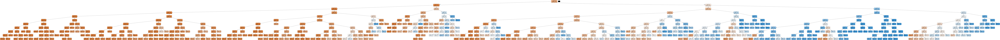

In [262]:
#visualizing best decision tree

dot_data = StringIO()

export_graphviz(dtree2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

# Part 4: 

##8. Automation of Performance Tuning

In [263]:
#read performance csv file as pandas dataframe

performance = pd.read_csv('performance.csv')
performance

,Split Criteria (Entropy or Gini),Minimum Sample Split,Minimum Sample Leaf,Maximum Depth,Accuracy,Recall,Precision,F1 Score
0,Entropy,2,10,30,NaN,NaN,NaN,NaN
1,Entropy,30,20,10,NaN,NaN,NaN,NaN
2,Entropy,10,15,2,NaN,NaN,NaN,NaN
3,Entropy,40,5,3,NaN,NaN,NaN,NaN
4,Gini Impurity,30,10,10,NaN,NaN,NaN,NaN
5,Gini Impurity,40,20,2,NaN,NaN,NaN,NaN
6,Gini Impurity,10,15,10,NaN,NaN,NaN,NaN
7,Gini Impurity,2,15,20,NaN,NaN,NaN,NaN


In [264]:
#create function that fills in dataframe with performance metrics
def parameters(criterion, min_samples_split, min_samples_leaf, max_depth):
  performance = pd.read_csv('performance.csv')
  dtree = DecisionTreeClassifier(criterion = criterion,
                                min_samples_leaf =  min_samples_leaf,
                                min_samples_split = min_samples_split,
                                max_depth = max_depth)
  dtree.fit(x_train, y_train)
  y_pred = dtree.predict(x_test)
  
  accuracy = accuracy_score(y_test, y_pred)
  recall = recall_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred)
  f1score = f1_score(y_test, y_pred)

  performance = performance.fillna({'Accuracy' : accuracy, 'Recall' : recall, 
                                    'Precision': precision,'F1 Score': f1score})

  return performance

In [265]:
model1 = parameters('entropy', 2, 10, 30)
model2 = parameters('entropy', 30, 20, 10)
model3 = parameters('entropy', 10, 15, 2)
model4 = parameters('entropy', 40, 5, 3)
model5 = parameters('gini', 30, 10, 10)
model6 = parameters('gini', 40, 20, 2)
model7 = parameters('gini', 10, 15, 10)
model8 = parameters('gini', 2, 15, 20)

performance = pd.concat([model1, model2, model3, model4, model5, model6, model7, model8])
performance

#i am able to fill in the data, but what i found is that the (accuracy, recall, precision, f1 score) from each model are being concatinated to all records in the .csv
#so that means that there are 64 record rather than  just the 8 models

,Split Criteria (Entropy or Gini),Minimum Sample Split,Minimum Sample Leaf,Maximum Depth,Accuracy,Recall,Precision,F1 Score
0,Entropy,2,10,30,0.839568,0.561882,0.699806,0.623305
1,Entropy,30,20,10,0.839568,0.561882,0.699806,0.623305
2,Entropy,10,15,2,0.839568,0.561882,0.699806,0.623305
3,Entropy,40,5,3,0.839568,0.561882,0.699806,0.623305
4,Gini Impurity,30,10,10,0.839568,0.561882,0.699806,0.623305
...,...,...,...,...,...,...,...,...
3,Entropy,40,5,3,0.840305,0.561102,0.702932,0.624060
4,Gini Impurity,30,10,10,0.840305,0.561102,0.702932,0.624060
5,Gini Impurity,40,20,2,0.840305,0.561102,0.702932,0.624060
6,Gini Impurity,10,15,10,0.840305,0.561102,0.702932,0.624060


# Part 5:

##9. Predicting using your "trained" Decision Tree Model

In [266]:
#x_train.columns

dtree2.fit(x_train.values, y_train.values)
y_pred=dtree2.predict(x_test.values)

new = [[0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,1,0,0,0,1,0]]
y_pred = dtree2.predict(new)
print(y_pred)

#this new individual is predicited to be in the less than or equal to $50K income category!

[0]


In [267]:
y_pred = dtree2.predict(new)
dtree2.predict_proba(new)

#72.4% probability this individual is in 0 income class AND 27.6% probability this individual is in 1 income class!
#84.3% accuracy from this Decision Tree Model

array([[0.72413793, 0.27586207]])